#Key Links

*   https://www.kaggle.com/c/inaturalist-2019-fgvc6

*   https://github.com/visipedia/inat_comp (navigate to 2019 - there are multiple years posted here)

*   https://sites.google.com/view/fgvc6/competitions/inaturalist-2019

*   Note this one is for 2017 challenge (not 2019), but it has some helpful info not found yet for 2019: https://sites.google.com/view/fgvc4/competitions/inaturalist

#Summary of Files and Directories in the 'inputs_original' Directory
The following files/directories are taken from the github page linked above for the 2019 challenge. They are also available on the kaggle competition page (first link above).


*   **train_val2019 (directory) -** This contains all the image files from the training and validation sets (in nested subdirectories)
*   **test2019 (directory) -**  This contains all the image files for the test set.
*   **train_val2019.tar.gz** and **test2019.tar.gz** (files) - these have already been unpacked into the above directories (see above), so are not needed.
*   **train2019.json and val2019.json (files) -** These files have the same structure - one is for the training set and the other for the validation set. These .json files are loaded below as dictionaries, and then the notebook converts certain components from these into to data frames (annotations, categories, and images). Other componenents seem less useful and are not loaded (info and licenses).
*   **test2019.json -** this is similar to the train2019.json and val2019.json (see above), except that it lacks certain items (annotations and categories). It only has these items: images, info, and licenses.
*   **categories.json -**  This has similar content to what is in the 'categories' item in the train2019.json and val2019.json. However, this one is unobfuscated (i.e., the names are real, rather than coded values that are unintelligible).
*   **kaggle_sample_submission.csv -** Self-explanatory



# Mounting Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/MSDS_422_Group/Final_Project

/content/drive/MyDrive/MSDS_422_Group/Final_Project


# Imports

In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.applications import ResNet50, MobileNetV2, EfficientNetB0, InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img
import joblib
import json
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import nbconvert
import numpy as np
import os
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras import backend as K
from random import seed
from tqdm.notebook import tqdm
tqdm.pandas()
from PIL import Image

%matplotlib inline
sns.set()

In [4]:
input_dir = os.path.join(os.getcwd(),'inputs_original')

new_inputs_dir = os.path.join(os.getcwd(),'new_inputs')

output_dir = os.path.join(os.getcwd(),'outputs')

#Establishing and Checking Computing Resources

Source: https://colab.research.google.com/notebooks/tpu.ipynb

First, enable TPUs for the Colab notebook:


*   Navigate to Edit→Notebook Settings
*   Select 'TPU v2' from the Hardware Accelerator drop-down

Next, check that we can connect to the TPU:

In [5]:
print("Tensorflow version " + tf.__version__)

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print(f'Running on a TPU w/{tpu.num_accelerators()["TPU"]} cores')
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

Tensorflow version 2.15.0
Running on a TPU w/8 cores


The below is not needed, because "by default, Keras will try and fit your model in parallel (multiprocessing) using all the cores available on your machine." Source: https://stackoverflow.com/questions/61875635/is-it-possible-to-fit-a-keras-model-via-cpu-multiprocessing#:~:text=By%20default%2C%20Keras%20will%20try,cores%20available%20on%20your%20machine.

We just need to makes sure that we are connected to TPU (which we did above), and then also nest the model creation within a  
`with tpu_strategy.scope():`   
statement, which we will do below. Creating the model in the TPUStrategy scope means we will train the model on the TPU.

In [ ]:
'''jobs = 4 # number of cores
config = tf.ConfigProto(intra_op_parallelism_threads=jobs,
                     inter_op_parallelism_threads=jobs,
                     allow_soft_placement=True,
                     device_count={'CPU': jobs})
session = tf.Session(config=config)
K.set_session(session)'''

#Data Ingestion

First only ingesting the annotations. The collection of images is large and does not make sense to load into memory at one time.

In [6]:
# Opening JSON file that has the annotations for the training data set
f = open(os.path.join(input_dir,"train2019.json"))
# returns JSON object as a dictionary - assign to an object
training_annotations_dict = json.load(f)
# Closing file
f.close()

# Opening JSON file that has the annotations for the validation data set
f = open(os.path.join(input_dir,"val2019.json"))
# returns JSON object as a dictionary - assign to an object
val_annotations_dict = json.load(f)
# Closing file
f.close()

# Opening JSON file that has the unobfuscated category names
f = open(os.path.join(input_dir,"categories.json"))
# returns JSON object as a dictionary - assign to an object
clear_categories = json.load(f)
# Closing file
f.close()

# Opening JSON file that has the test info
f = open(os.path.join(input_dir,"test2019.json"))
# returns JSON object as a dictionary - assign to an object
test_annotations_dict = json.load(f)
# Closing file
f.close()

In [ ]:
sample_submission = pd.read_csv(os.path.join(input_dir,'kaggle_sample_submission.csv'))
sample_submission.head()

,id,predicted
0,268243,842
1,268244,139
2,268245,988
3,268246,612
4,268247,468


##Concise Generation of Training and Validation Subsets



In [7]:
# create data frame from unobfuscated categories...
# 'clear_categories' was initially defined above from a separate .json file.
# here we redefine it as a data frame
rows = []
for c in range(0, len(clear_categories)):
  rows.append(clear_categories[c])

clear_categories = pd.DataFrame(rows)

###Training

In [8]:
# pull annotations
train_df = pd.DataFrame(training_annotations_dict['annotations'])[['image_id','category_id']]

# pull image info (filenames)
train_img = pd.DataFrame(training_annotations_dict['images'])[['id', 'file_name']].rename(columns={'id':'image_id'})

# merge the two above into one data frame
train_df = train_df.merge(train_img, on='image_id')

# merge in class information
train_df = train_df.merge(clear_categories, left_on='category_id', right_on='id')

# convert id columns to string since they are nominal
train_df['category_id'] = train_df['category_id'].astype(str)
train_df['image_id'] = train_df['image_id'].astype(str)

# view result
# train_df.head()

###Validation

In [9]:
# pull annotations
val_df = pd.DataFrame(val_annotations_dict['annotations'])[['image_id','category_id']]

# pull image info (filenames)
val_img = pd.DataFrame(val_annotations_dict['images'])[['id', 'file_name']].rename(columns={'id':'image_id'})

# merge the two above into one data frame
val_df = val_df.merge(val_img, on='image_id')

# merge in class information
val_df = val_df.merge(clear_categories, left_on='category_id', right_on='id')

# convert id columns to string since they are nominal
val_df['category_id'] = val_df['category_id'].astype(str)
val_df['image_id'] = val_df['image_id'].astype(str)

# view result
# val_df.head()

###Filtering to Just Amphibians

In [10]:
amphibians_train_annotations = train_df[train_df['class'] == 'Amphibia']

amphibians_val_annotations = val_df[val_df['class'] == 'Amphibia']

###Rendering Streamlined Annotation Files

In [11]:
amphibians_train_labels_simple = amphibians_train_annotations[['image_id', 'category_id', 'file_name']]

amphibians_test_labels_simple = amphibians_val_annotations[['image_id', 'category_id', 'file_name']]

##Data Pre-Processing and Feature Engineering

In [12]:
# Verify file existence
def verify_filenames(df, directory, filename_col):
    valid_filenames = [f for f in df[filename_col] if os.path.isfile(os.path.join(directory, f))]
    return df[df[filename_col].isin(valid_filenames)]

# # Filter out invalid filenames from train_labels_simple
# train_labels_cleaned = verify_filenames(train_labels_simple, input_dir, 'file_name')
train_labels_cleaned = verify_filenames(amphibians_train_labels_simple, input_dir, 'file_name')

# # Filter out invalid filenames from val_df
# val_df_cleaned = verify_filenames(val_df, input_dir, 'file_name')
val_df_cleaned = verify_filenames(amphibians_test_labels_simple, input_dir, 'file_name')

# Check if the 'category_id' column exists and is valid
if 'category_id' not in train_labels_cleaned.columns or 'category_id' not in val_df_cleaned.columns:
    raise KeyError("The 'category_id' column is missing from the cleaned dataframes")

# Check the number of unique classes again
num_classes_train_cleaned = train_labels_cleaned['category_id'].nunique()
num_classes_val_cleaned = val_df_cleaned['category_id'].nunique()

print(f"Number of classes in cleaned training set: {num_classes_train_cleaned}")
print(f"Number of classes in cleaned validation set: {num_classes_val_cleaned}")

# Ensure both are the same
assert num_classes_train_cleaned == num_classes_val_cleaned, "Number of classes in cleaned train and validation sets do not match!"
num_classes = num_classes_train_cleaned  # Assuming they match

Number of classes in cleaned training set: 10
Number of classes in cleaned validation set: 10


In [13]:
train_labels_cleaned_subset = train_labels_cleaned
val_df_cleaned_subset = val_df_cleaned

# Model Building

https://sites.google.com/view/fgvc4/competitions/inaturalist

https://www.kaggle.com/competitions/inaturalist-2019-fgvc6/code

https://keras.io/api/applications/inceptionv3/

https://keras.io/guides/transfer_learning/

https://keras.io/api/applications/#usage-examples-for-image-classification-models

https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3/preprocess_input

https://research.google.com/colaboratory/faq.html#usage-limits

https://colab.research.google.com/notebooks/tpu.ipynb




Set random seed for replicability and for fair comparison of different approaches.

In [14]:
seed(3)

## InceptionV3 - original try - avg validation accuracy of 0.278

https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3/preprocess_input

https://keras.io/api/applications/inceptionv3/

In [ ]:
len(train_labels_cleaned_subset)

3882

In [ ]:
len(val_df_cleaned_subset)

30

Setting batch size equal to 6 for both training and validation sets. Does not need to be the same for these, but it is important that this number divides evenly into the total number of images in each set.

Setting "shuffle" to False for the validation since we need the images in order to predict the outputs and match them with their unique ids or filenames.

In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 width_shift_range=.15,
                                 height_shift_range=.15,
                                 horizontal_flip=True,
                                 zoom_range=0.5,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

Found 3882 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


In [ ]:
# Build the InceptionV3 model
IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
x = IV3base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
%%time
# Freeze the base model layers
for layer in IV3base_model.layers:
    layer.trainable = False

# Compile the model
# could try optimizer = 'rmsprop'
IV3model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=3)

joblib.dump(IV3model, "IV3model.joblib")

Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


647/647 ━━━━━━━━━━━━━━━━━━━━ 3584s 5s/step - accuracy: 0.2558 - loss: 2.2732 - val_accuracy: 0.2000 - val_loss: 2.1602
Epoch 2/3
647/647 ━━━━━━━━━━━━━━━━━━━━ 173s 195ms/step - accuracy: 0.3868 - loss: 1.6947 - val_accuracy: 0.3000 - val_loss: 1.8643
Epoch 3/3
647/647 ━━━━━━━━━━━━━━━━━━━━ 127s 195ms/step - accuracy: 0.3967 - loss: 1.6110 - val_accuracy: 0.3333 - val_loss: 1.8687
CPU times: user 7min 30s, sys: 11 s, total: 7min 41s
Wall time: 1h 5min 5s


['IV3model.joblib']

In [ ]:
%%time
# Freeze the base model layers
for layer in IV3base_model.layers:
    layer.trainable = False

# Compile the model
# could try optimizer = 'rmsprop'
IV3model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=3)

joblib.dump(IV3model, "IV3model.joblib")

Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


647/647 ━━━━━━━━━━━━━━━━━━━━ 3584s 5s/step - accuracy: 0.2558 - loss: 2.2732 - val_accuracy: 0.2000 - val_loss: 2.1602
Epoch 2/3
647/647 ━━━━━━━━━━━━━━━━━━━━ 173s 195ms/step - accuracy: 0.3868 - loss: 1.6947 - val_accuracy: 0.3000 - val_loss: 1.8643
Epoch 3/3
647/647 ━━━━━━━━━━━━━━━━━━━━ 127s 195ms/step - accuracy: 0.3967 - loss: 1.6110 - val_accuracy: 0.3333 - val_loss: 1.8687
CPU times: user 7min 30s, sys: 11 s, total: 7min 41s
Wall time: 1h 5min 5s


['IV3model.joblib']

## InceptionV3 - Second attempt - validation accuracy of 0.366
Increased to five epochs. Also tried more than that, but did not improve any further.... deleted that attempt.

In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 width_shift_range=.15,
                                 height_shift_range=.15,
                                 horizontal_flip=True,
                                 zoom_range=0.5,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

Found 3882 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


Note: in the below, if include_top were set to True then the input_shape would need to be (299, 299, 3)... however, since we are setting include_top equal to False, we do not need to be constrained by that height and width (but still does need to have 3 channels). Source: https://keras.io/api/applications/inceptionv3/

In [ ]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Freeze the base model layers
  for layer in IV3base_model.layers:
    layer.trainable = False

  # Compile
  IV3model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

IV3model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 149, 149, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 149, 149, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 149, 149, 32)         0         ['batch_normalization_94[0

In [ ]:
%%time
# Train the model
history = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=5)

final_accuracy = history.history["val_accuracy"][-5:]
print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))

Epoch 1/5
647/647 [==============================] - 1173s 2s/step - loss: 1.9900 - accuracy: 0.3022 - val_loss: 1.8655 - val_accuracy: 0.3667
Epoch 2/5
647/647 [==============================] - 111s 172ms/step - loss: 1.7021 - accuracy: 0.3764 - val_loss: 1.9657 - val_accuracy: 0.3667
Epoch 3/5
647/647 [==============================] - 111s 172ms/step - loss: 1.6418 - accuracy: 0.3993 - val_loss: 1.8059 - val_accuracy: 0.3000
Epoch 4/5
647/647 [==============================] - 113s 174ms/step - loss: 1.5995 - accuracy: 0.4163 - val_loss: 1.7150 - val_accuracy: 0.4333
Epoch 5/5
647/647 [==============================] - 112s 173ms/step - loss: 1.5718 - accuracy: 0.4199 - val_loss: 1.9793 - val_accuracy: 0.3667
FINAL ACCURACY MEAN-5:  0.36666667461395264
CPU times: user 19min 21s, sys: 2min 11s, total: 21min 32s
Wall time: 27min 5s


In [ ]:
# We can save our model with:
IV3model.save('IV3model_v2.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# and reload it with:
reloaded_model = tf.keras.models.load_model('IV3model_v2.h5')

<ipython-input-21-32d0557bc7f0>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


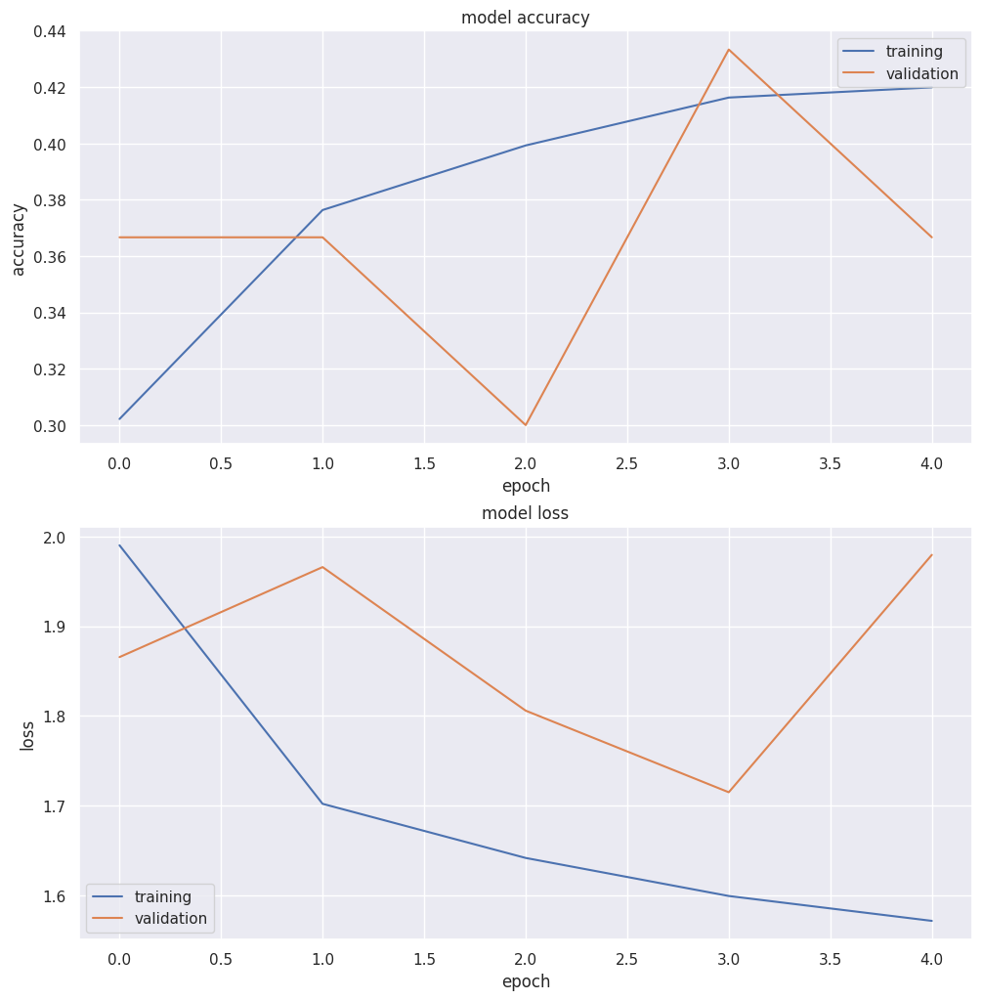

In [ ]:
# source for the below function:  https://colab.research.google.com/notebooks/tpu.ipynb
def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])

plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

##InceptionV3 Third Attempt - validation accuracy of 0.100
This time instead of freezing all the bottom layers, left them as trainable, but using a very slow but evolving learning rate (source: https://colab.research.google.com/notebooks/tpu.ipynb)

In [ ]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
  # This time making the whole thing trainable
  IV3base_model.trainable = True
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Compile
  IV3model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

#IV3model.summary()

87910968/87910968 [==============================] - 0s 0us/step


Learning rate per epoch:


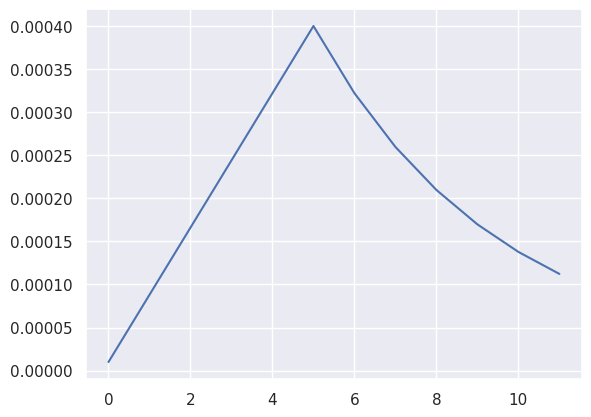

In [ ]:
EPOCHS = 12

batch_size = 16 * tpu_strategy.num_replicas_in_sync

start_lr = 0.00001
min_lr = 0.00001
max_lr = 0.00005 * tpu_strategy.num_replicas_in_sync
rampup_epochs = 5
sustain_epochs = 0
exp_decay = .8

def lrfn(epoch):
  if epoch < rampup_epochs:
    return (max_lr - start_lr)/rampup_epochs * epoch + start_lr
  elif epoch < rampup_epochs + sustain_epochs:
    return max_lr
  else:
    return (max_lr - min_lr) * exp_decay**(epoch-rampup_epochs-sustain_epochs) + min_lr

lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

rang = np.arange(EPOCHS)
y = [lrfn(x) for x in rang]
plt.plot(rang, y)
print('Learning rate per epoch:')

In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 width_shift_range=.15,
                                 height_shift_range=.15,
                                 horizontal_flip=True,
                                 zoom_range=0.5,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=batch_size,
    shuffle=True,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=input_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=batch_size,
    shuffle=False,
    class_mode="categorical",
    target_size=(299, 299)  # InceptionV3 default size
)

Found 3882 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


In [ ]:
%%time
# Train the model
train_steps = len(train_labels_cleaned_subset) // batch_size
validation_steps = len(val_df_cleaned_subset) // batch_size

history = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned,
                    steps_per_epoch=train_steps, epochs=EPOCHS, callbacks=[lr_callback])

final_accuracy = history.history["val_accuracy"][-5:]
print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/12
30/30 [==============================] - 1098s 34s/step - loss: 2.2309 - accuracy: 0.1708 - val_loss: 2.4129 - val_accuracy: 0.1000 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/12
30/30 [==============================] - 140s 5s/step - loss: nan - accuracy: 0.1492 - val_loss: nan - val_accuracy: 0.1000 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/12
30/30 [==============================] - 107s 4s/step - loss: nan - accuracy: 0.1287 - val_loss: nan - val_accuracy: 0.1000 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/12
30/30 [==============================] - 109s 4s/step - loss: nan - accuracy: 0.1295 - val_loss: nan - val_accuracy: 0.1000 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/12
30/30 [==============================] - 1

KeyboardInterrupt: 

##InceptionV3 - Fourth attempt - validation accuracy = 0.366
Changes:
*   Center cropped images to 200x200 pixels and saved the resulting copies in a new directory, and used those for training and validation instead of the original input images. Did the center-cropping pre-processing on the CPU to save limited TPU units for when they will be needed later when training the model.
*   Commented out some of the data augmentation components (width and height shift, zoom, and shear)

Resulting validation accuracy was not any better than attempt #2, but the model was much faster to train.



Example center-crop transformation is below:

In [ ]:
sourcefolder = input_dir
filename = amphibians_train_labels_simple['file_name'][0]
cropdimensions = (200, 200)

**Before**

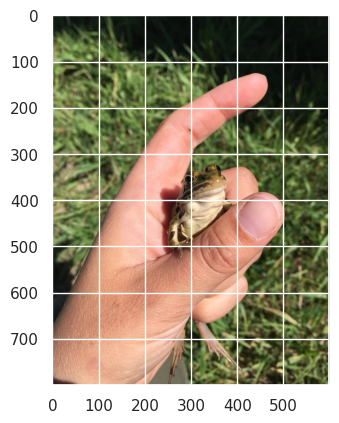

In [ ]:
img = mpimg.imread(os.path.join(sourcefolder, filename))
plt.imshow(img)

**After**

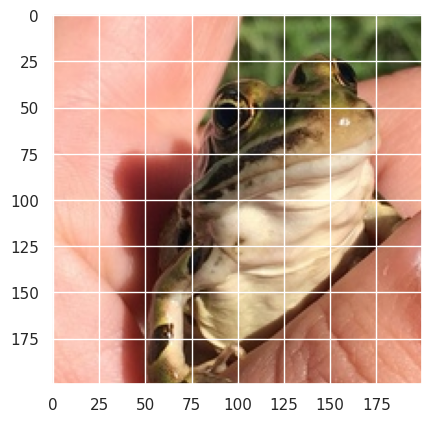

In [ ]:
img = center_crop(img, cropdimensions)
plt.imshow(img)

In [ ]:
# source: https://github.com/jkjung-avt/keras-cats-dogs-tutorial/blob/master/predict_cropped.py
def center_crop(img, crop_size):
    height, width = img.shape[0], img.shape[1]
    dy, dx = crop_size
    x = (width - dx + 1) // 2
    y = (height - dy + 1) // 2
    if len(img.shape) == 3:
      return img[y:(y+dy), x:(x+dx), :]
    elif len(img.shape) == 2:
      return img[y:(y+dy), x:(x+dx)]

def crop_and_save(sourcefolder, destinationfolder, filenames, cropdimensions):
  for filename in filenames:
    if not os.path.exists(os.path.join(destinationfolder, filename)):
      img = mpimg.imread(os.path.join(sourcefolder, filename))
      img = center_crop(img, cropdimensions)

      split_fn = filename.rsplit('/', 1)

      dest_folder = os.path.join(destinationfolder, split_fn[0])

      if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

      if len(img.shape) < 3:
        print(f"Error saving {filename}")
      else:
        mpimg.imsave(os.path.join(destinationfolder, filename), img)

In [ ]:
%%time
crop_and_save(input_dir, new_inputs_dir, amphibians_train_labels_simple['file_name'], (200, 200))

crop_and_save(input_dir, new_inputs_dir, amphibians_test_labels_simple['file_name'], (200, 200))

Error saving train_val2019/Amphibians/160/a406bf4b672bcc9201aebcce7c417c1b.jpg
CPU times: user 18 s, sys: 1.71 s, total: 19.8 s
Wall time: 6min 38s


In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 #width_shift_range=.15,
                                 #height_shift_range=.15,
                                 horizontal_flip=True,
                                 #zoom_range=0.5,
                                 #shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(200, 200)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(200, 200)
)

Found 3881 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 1 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  warnings.warn(


In [ ]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(200, 200, 3))
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Freeze the base model layers
  for layer in IV3base_model.layers:
    layer.trainable = False

  # Compile
  IV3model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

#IV3model.summary()

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
%%time
# Train the model
history = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=8)

final_accuracy = history.history["val_accuracy"][-5:]
print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))

Epoch 1/8
647/647 [==============================] - 1019s 2s/step - loss: 1.9161 - accuracy: 0.3365 - val_loss: 1.8175 - val_accuracy: 0.2333
Epoch 2/8
647/647 [==============================] - 52s 81ms/step - loss: 1.5717 - accuracy: 0.4239 - val_loss: 1.7891 - val_accuracy: 0.2000
Epoch 3/8
647/647 [==============================] - 52s 81ms/step - loss: 1.5003 - accuracy: 0.4473 - val_loss: 1.9056 - val_accuracy: 0.4000
Epoch 4/8
647/647 [==============================] - 53s 82ms/step - loss: 1.4498 - accuracy: 0.4834 - val_loss: 1.7809 - val_accuracy: 0.3667
Epoch 5/8
647/647 [==============================] - 53s 81ms/step - loss: 1.4274 - accuracy: 0.4736 - val_loss: 1.7243 - val_accuracy: 0.3333
Epoch 6/8
647/647 [==============================] - 52s 81ms/step - loss: 1.3982 - accuracy: 0.4883 - val_loss: 1.7515 - val_accuracy: 0.3667
Epoch 7/8
647/647 [==============================] - 53s 81ms/step - loss: 1.3834 - accuracy: 0.4901 - val_loss: 1.7139 - val_accuracy: 0.3667

In [ ]:
# save model
save_path = os.path.join(output_dir, 'IV3models', 'IV3model_v4.keras')
IV3model.save(save_path)

<ipython-input-19-32d0557bc7f0>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


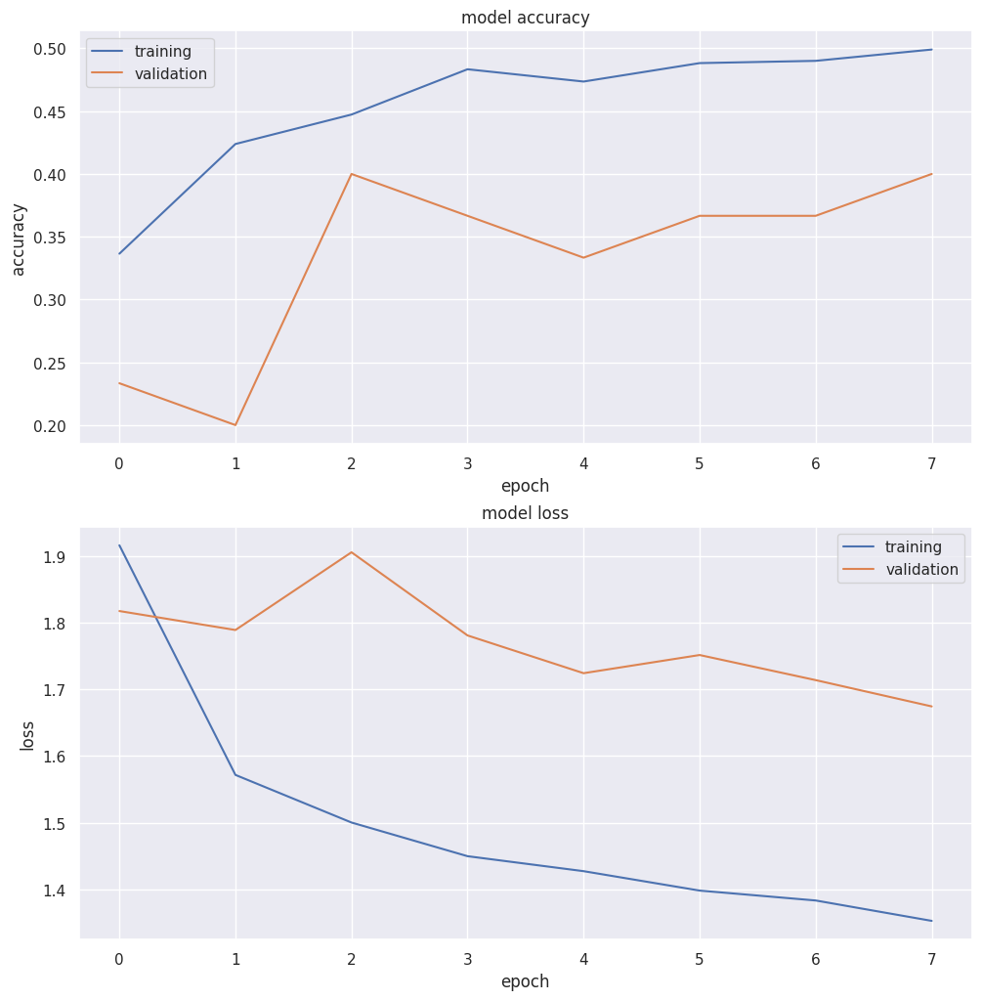

In [ ]:
# source for the below function:  https://colab.research.google.com/notebooks/tpu.ipynb
def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])

plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

##InceptionV3 - Fifth attempt - validation accuracy of 0.380
Same as fourth attempt, except:
*   Increased number of epochs to 12
*   Added early stopping (with the early stopping it actually only made it to 9 epochs before it stopped).



In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 #width_shift_range=.15,
                                 #height_shift_range=.15,
                                 horizontal_flip=True,
                                 #zoom_range=0.5,
                                 #shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(200, 200)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(200, 200)
)

Found 3881 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 1 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  warnings.warn(


In [ ]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(200, 200, 3))
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Freeze the base model layers
  for layer in IV3base_model.layers:
    layer.trainable = False

  #optimizer = tf.keras.optimizers.SGD(learning_rate=0.2, momentum=0.9, decay = 0.01)

  # Compile
  IV3model.compile(
    optimizer="adam",
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

#IV3model.summary()

In [ ]:
early_stopping_cb2 = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

In [ ]:
%%time
# Train the model
history5 = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=12, callbacks = early_stopping_cb2)

final_accuracy = history5.history["val_accuracy"][-5:]
print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))

Epoch 1/12
647/647 [==============================] - 85s 103ms/step - loss: 1.9067 - accuracy: 0.3527 - val_loss: 2.0166 - val_accuracy: 0.3000
Epoch 2/12
647/647 [==============================] - 53s 81ms/step - loss: 1.5882 - accuracy: 0.4123 - val_loss: 2.0957 - val_accuracy: 0.3000
Epoch 3/12
647/647 [==============================] - 55s 85ms/step - loss: 1.5153 - accuracy: 0.4393 - val_loss: 2.0105 - val_accuracy: 0.4333
Epoch 4/12
647/647 [==============================] - 54s 84ms/step - loss: 1.4565 - accuracy: 0.4581 - val_loss: 1.9228 - val_accuracy: 0.3667
Epoch 5/12
647/647 [==============================] - 54s 84ms/step - loss: 1.4139 - accuracy: 0.4898 - val_loss: 1.7777 - val_accuracy: 0.4000
Epoch 6/12
647/647 [==============================] - 54s 84ms/step - loss: 1.3905 - accuracy: 0.4960 - val_loss: 1.6826 - val_accuracy: 0.4000
Epoch 7/12
647/647 [==============================] - 53s 81ms/step - loss: 1.3793 - accuracy: 0.4991 - val_loss: 1.8163 - val_accuracy

In [ ]:
# save model
save_path = os.path.join(output_dir, 'IV3models', 'IV3model_v6.keras')
IV3model.save(save_path)

<ipython-input-19-32d0557bc7f0>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


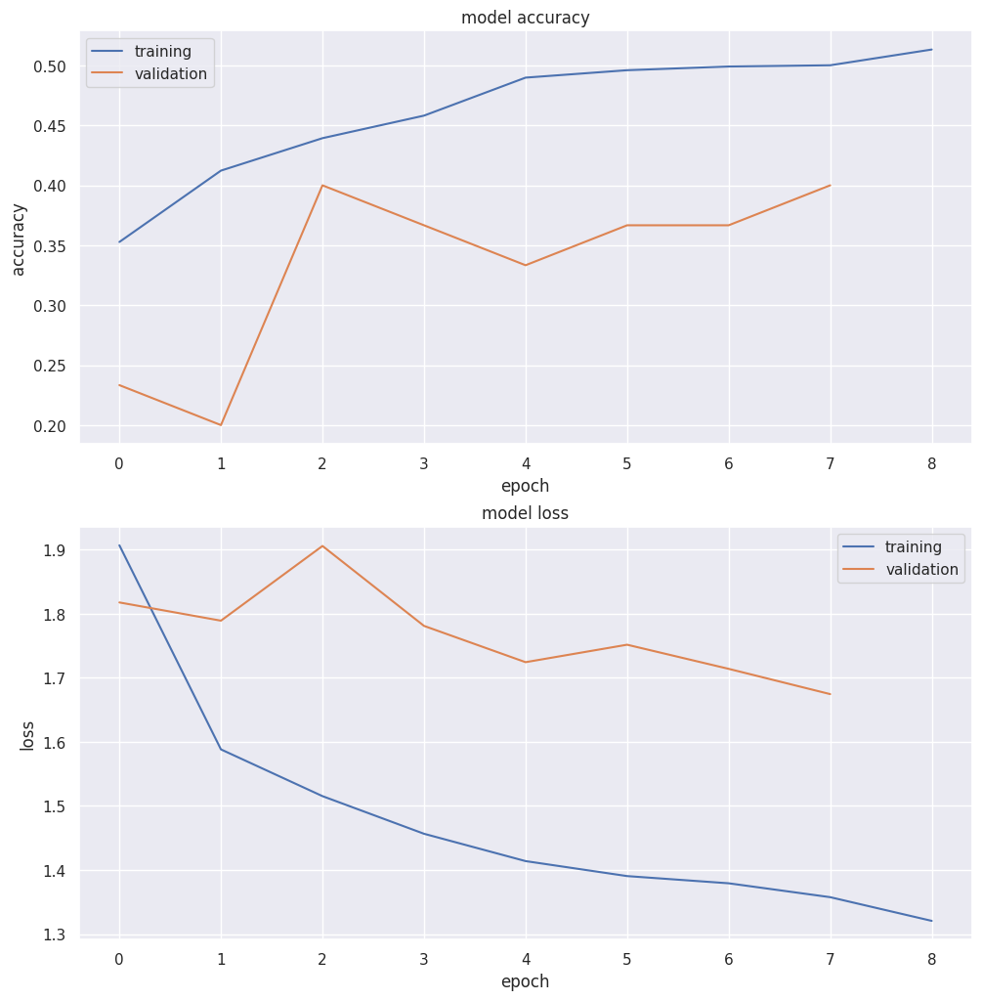

In [ ]:
plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(history5.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history5.history['loss'], history.history['val_loss'], 'loss', 212)

##InceptionV3 - Sixth attempt - validation accuracy of 0.400
Same as attempt 5, except reintroduced the data augmentation steps that were commented out back in the fourth and fifth attempts (width and height shift, zoom, and shear)

In [ ]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 width_shift_range=.15,
                                 height_shift_range=.15,
                                 horizontal_flip=True,
                                 zoom_range=0.5,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(200, 200)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(200, 200)
)

Found 3881 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 1 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  warnings.warn(


In [ ]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(200, 200, 3))
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Freeze the base model layers
  for layer in IV3base_model.layers:
    layer.trainable = False

  #optimizer = tf.keras.optimizers.SGD(learning_rate=0.2, momentum=0.9, decay = 0.01)

  # Compile
  IV3model.compile(
    optimizer="adam",
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

#IV3model.summary()

In [ ]:
early_stopping_cb2 = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

In [ ]:
%%time
# Train the model
history6 = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=12, callbacks = early_stopping_cb2)

final_accuracy = history6.history["val_accuracy"][-5:]
print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))

Epoch 1/12
647/647 [==============================] - 57s 87ms/step - loss: 1.5663 - accuracy: 0.4200 - val_loss: 1.7740 - val_accuracy: 0.4000
Epoch 2/12
647/647 [==============================] - 55s 85ms/step - loss: 1.5466 - accuracy: 0.4349 - val_loss: 1.6837 - val_accuracy: 0.4333
Epoch 3/12
647/647 [==============================] - 53s 82ms/step - loss: 1.5340 - accuracy: 0.4270 - val_loss: 1.8035 - val_accuracy: 0.4333
Epoch 4/12
647/647 [==============================] - 53s 81ms/step - loss: 1.4973 - accuracy: 0.4512 - val_loss: 1.8134 - val_accuracy: 0.3667
Epoch 5/12
647/647 [==============================] - 60s 92ms/step - loss: 1.4953 - accuracy: 0.4522 - val_loss: 1.8553 - val_accuracy: 0.3667
FINAL ACCURACY MEAN-5:  0.4000000059604645
CPU times: user 9min 40s, sys: 1min 26s, total: 11min 6s
Wall time: 4min 40s


In [ ]:
# save model
save_path = os.path.join(output_dir, 'IV3models', 'IV3model_v6.keras')
IV3model.save(save_path)

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
#save_path = os.path.join(output_dir, 'IV3models', 'IV3model_v6.keras')
#IV3model6 = load_model(save_path)

<ipython-input-19-32d0557bc7f0>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


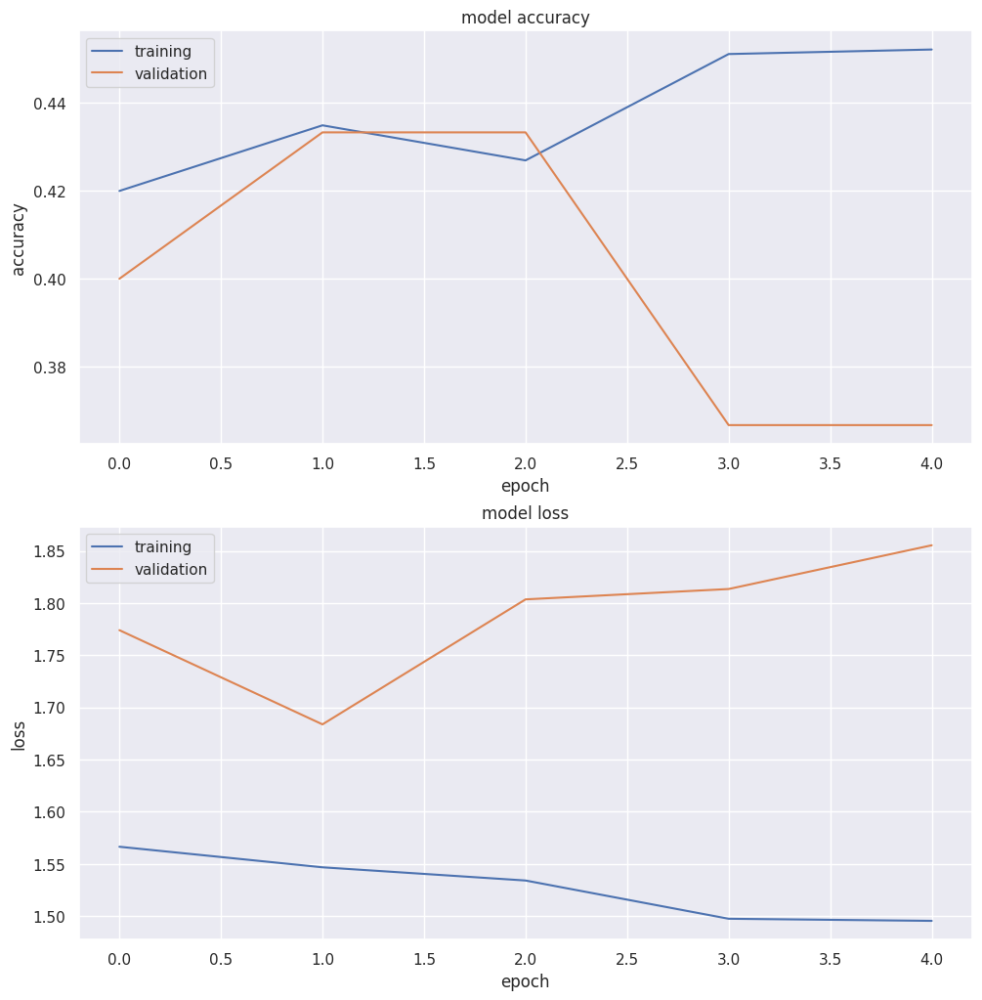

In [ ]:
plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(history6.history['accuracy'], history6.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history6.history['loss'], history6.history['val_loss'], 'loss', 212)

##InceptionV3 - Sixth attempt - validation accuracy of 0.333
Same as attempt 5, except reintroduced the data augmentation steps that were commented out back in the fourth and fifth attempts (width and height shift, zoom, and shear)

In [15]:
train_datagen=ImageDataGenerator(rescale=1./255,
                                 rotation_range=45,
                                 width_shift_range=.15,
                                 height_shift_range=.15,
                                 horizontal_flip=True,
                                 zoom_range=0.5,
                                 shear_range = 0.2,
                                 fill_mode = 'nearest',
                                 brightness_range = (0.5,1.5))

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator_inception_cleaned = train_datagen.flow_from_dataframe(
    dataframe=train_labels_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=True,
    class_mode="categorical",
    target_size=(200, 200)  # InceptionV3 default size
)

val_generator_inception_cleaned = val_datagen.flow_from_dataframe(
    dataframe=val_df_cleaned_subset,
    directory=new_inputs_dir,
    x_col="file_name",
    y_col="category_id",
    batch_size=6,
    shuffle=False,
    class_mode="categorical",
    target_size=(200, 200)
)

Found 3881 validated image filenames belonging to 10 classes.
Found 30 validated image filenames belonging to 10 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 1 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  warnings.warn(


In [16]:
def create_IV3model():
  # Build the InceptionV3 model
  IV3base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(200, 200, 3))
  x = IV3base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(1024, activation='relu')(x)
  predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes

  IV3model = Model(inputs=IV3base_model.input, outputs=predictions)

  # Freeze the base model layers
  for layer in IV3base_model.layers:
    layer.trainable = False

  #optimizer = tf.keras.optimizers.SGD(learning_rate=0.2, momentum=0.9, decay = 0.01)

  # Compile
  IV3model.compile(
    optimizer="adam",
    loss = 'categorical_crossentropy',
    metrics=[tf.keras.metrics.CategoricalAccuracy(),
             tf.keras.metrics.Precision(),
             tf.keras.metrics.Recall(),
             tf.keras.metrics.AUC()]
  )
  return IV3model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  IV3model = create_IV3model()

#IV3model.summary()

87910968/87910968 [==============================] - 1s 0us/step


In [17]:
early_stopping_cb2 = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

In [18]:
%%time
# Train the model
history = IV3model.fit(train_generator_inception_cleaned, validation_data=val_generator_inception_cleaned, epochs=12, callbacks = early_stopping_cb2)

Epoch 1/12
647/647 [==============================] - 1054s 2s/step - loss: 2.0297 - categorical_accuracy: 0.3079 - precision: 0.5066 - recall: 0.0995 - auc: 0.7684 - val_loss: 1.9951 - val_categorical_accuracy: 0.2667 - val_precision: 0.4000 - val_recall: 0.0667 - val_auc: 0.7610
Epoch 2/12
647/647 [==============================] - 55s 85ms/step - loss: 1.6981 - categorical_accuracy: 0.3775 - precision: 0.6339 - recall: 0.1446 - auc: 0.8255 - val_loss: 1.8944 - val_categorical_accuracy: 0.3333 - val_precision: 0.5000 - val_recall: 0.1667 - val_auc: 0.7791
Epoch 3/12
647/647 [==============================] - 56s 86ms/step - loss: 1.6442 - categorical_accuracy: 0.3942 - precision: 0.6388 - recall: 0.1672 - auc: 0.8386 - val_loss: 1.8033 - val_categorical_accuracy: 0.3000 - val_precision: 0.4000 - val_recall: 0.1333 - val_auc: 0.8068
Epoch 4/12
647/647 [==============================] - 56s 86ms/step - loss: 1.6205 - categorical_accuracy: 0.3994 - precision: 0.6518 - recall: 0.1842 - a

In [23]:
joblib.dump(history, 'history6.joblib')

['history6.joblib']

In [ ]:
history6 = joblib.load('history6.joblib')

In [21]:
b_size = 6

In [22]:
results = IV3model.evaluate(val_generator_inception_cleaned, batch_size=b_size)
print('Test loss:', results[0])
print('Test categorical_accuracy:', results[1])
print('Test precision:', results[2])
print('Test recall:', results[3])
print('Test auc:', results[4])

5/5 [==============================] - 1s 36ms/step - loss: 1.7294 - categorical_accuracy: 0.3333 - precision: 0.5000 - recall: 0.1667 - auc: 0.8223
Test loss: 1.7294304370880127
Test categorical_accuracy: 0.3333333432674408
Test precision: 0.5
Test recall: 0.1666666716337204
Test auc: 0.8223456740379333


In [ ]:
# save model
save_path = os.path.join(output_dir, 'IV3models', 'IV3model_v6.keras')
IV3model.save(save_path)

In [26]:
# Preparing for Confusion Matrix and Classification Report
# source: https://gist.github.com/RyanAkilos/3808c17f79e77c4117de35aa68447045

Y_pred = IV3model.predict_generator(val_generator_inception_cleaned, len(val_df_cleaned_subset) // b_size+1)
y_pred = np.argmax(Y_pred, axis=1)


<ipython-input-26-60488dfc9a80>:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = IV3model.predict_generator(val_generator_inception_cleaned, len(val_df_cleaned_subset) // b_size+1)


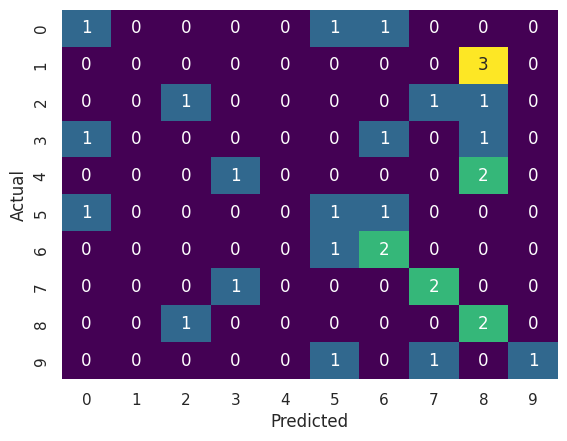

In [58]:
conf_matx = confusion_matrix(val_generator_inception_cleaned.classes, y_pred)
s = sns.heatmap(
      conf_matx,
      annot=True,
      annot_kws={"size": 12},
      fmt='g',
      cbar=False,
      cmap="viridis"
   )
s.set(xlabel="Predicted", ylabel="Actual")
plt.show()

In [29]:
# This function will plot images in a grid so we can view examples of the species
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

In [55]:
amph_species = train_labels_cleaned_subset.category_id.unique()

Sample images for species 158, which is indexed in the model and confusion matrix as species 5


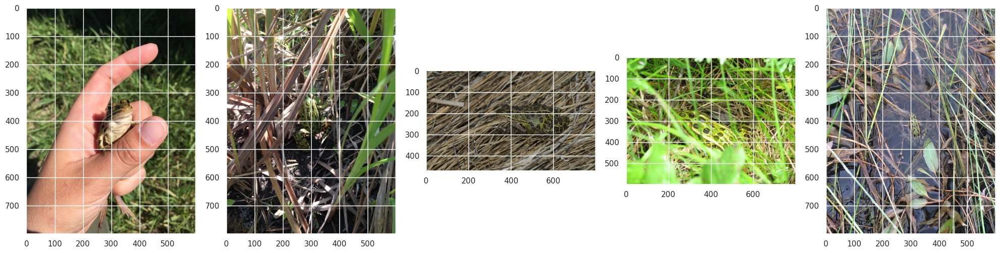

Sample images for species 159, which is indexed in the model and confusion matrix as species 6


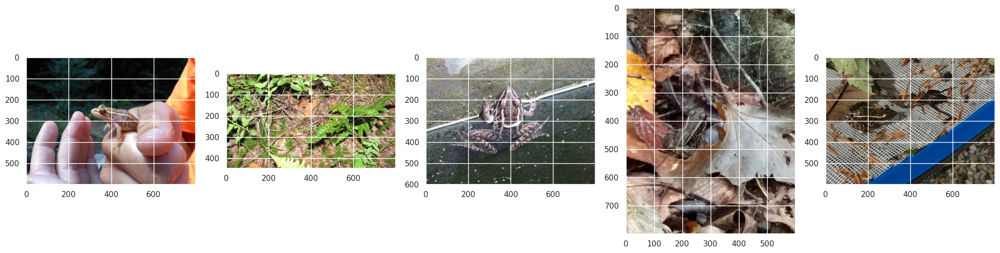

Sample images for species 157, which is indexed in the model and confusion matrix as species 4


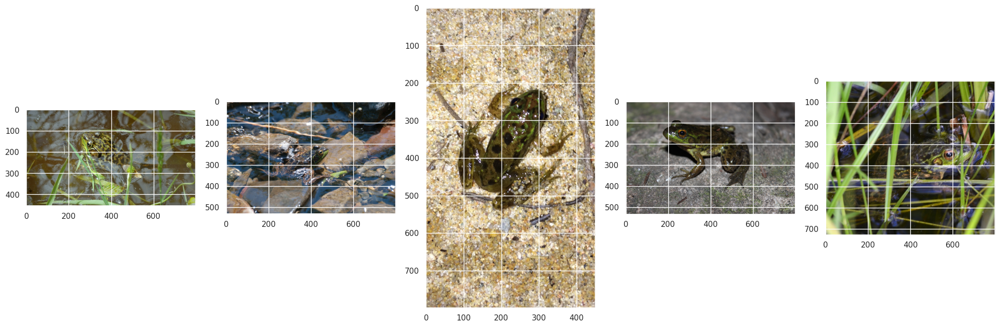

Sample images for species 153, which is indexed in the model and confusion matrix as species 0


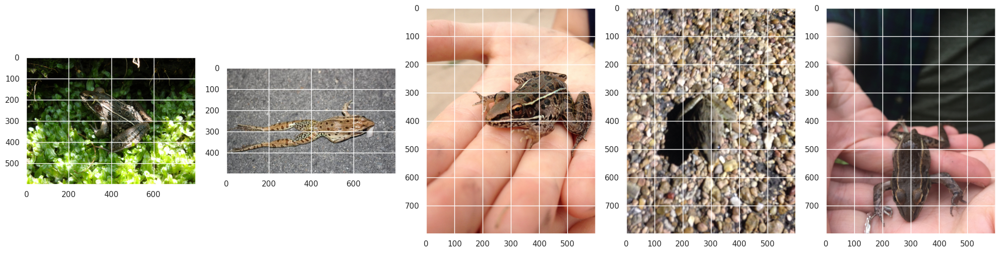

Sample images for species 162, which is indexed in the model and confusion matrix as species 9


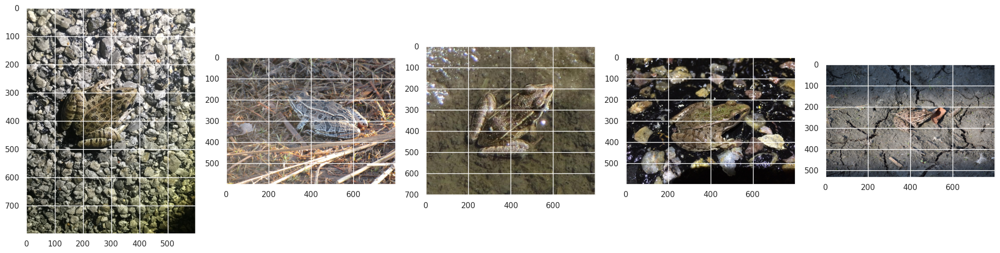

Sample images for species 156, which is indexed in the model and confusion matrix as species 3


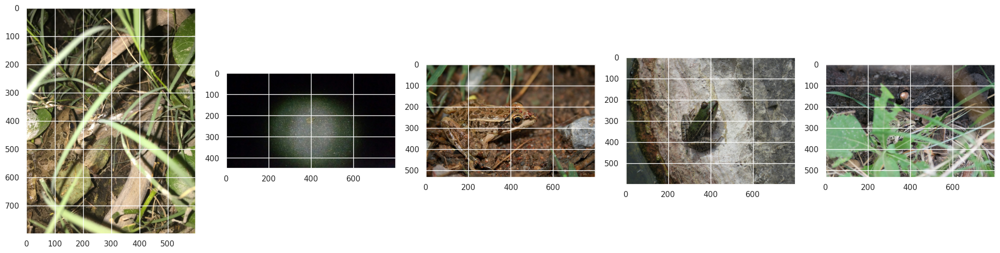

Sample images for species 160, which is indexed in the model and confusion matrix as species 7


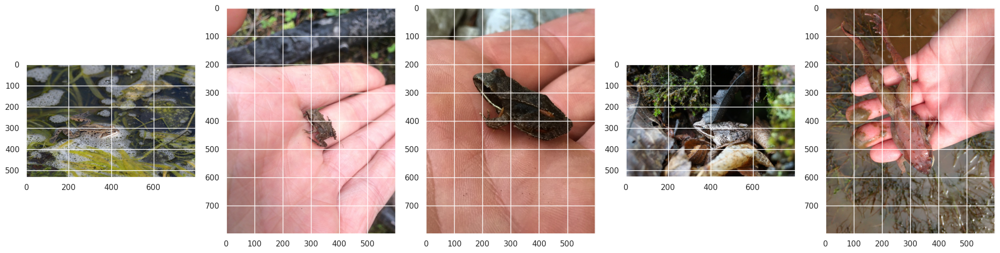

Sample images for species 155, which is indexed in the model and confusion matrix as species 2


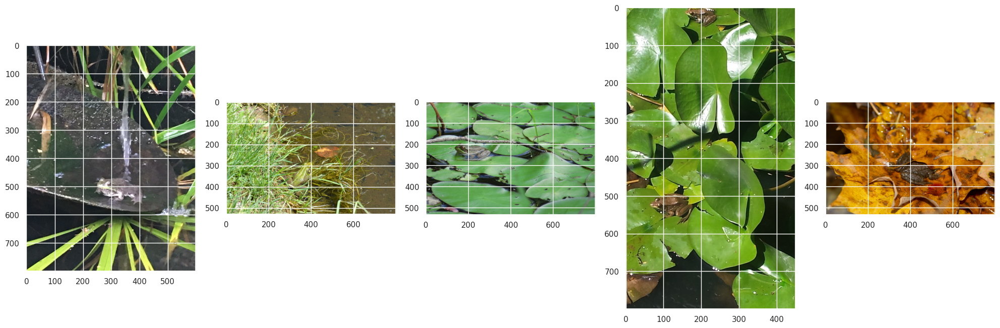

Sample images for species 154, which is indexed in the model and confusion matrix as species 1


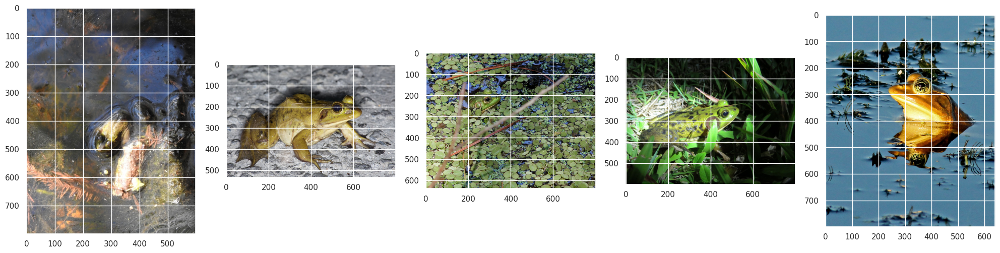

Sample images for species 161, which is indexed in the model and confusion matrix as species 8


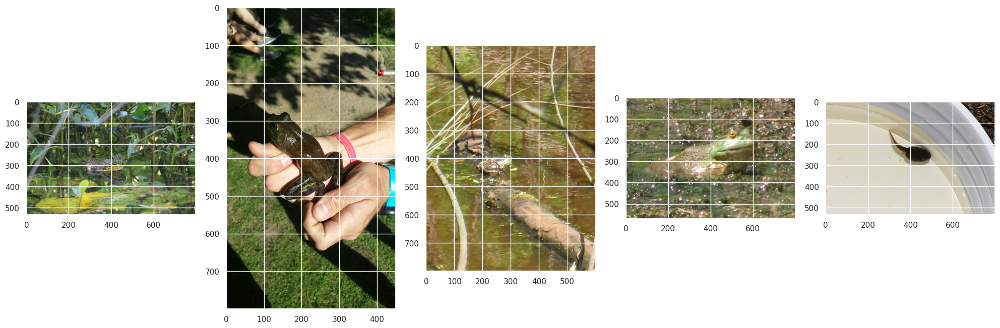

In [57]:
for species in amph_species:
  print("Sample images for species " + species + ", which is indexed in the model and confusion matrix as species " + str(train_generator_inception_cleaned.class_indices[species]))
  df = train_labels_cleaned_subset[train_labels_cleaned_subset['category_id'] == species]
  image_fns = df['file_name'][0:5]
  image_paths = [os.path.join(input_dir, fn) for fn in image_fns]
  images = [Image.open(os.path.join(input_dir, fn)) for fn in image_fns]
  #img_path = os.path.join(input_dir, fn)
  #img = mpimg.imread(img_path)
  plotImages(images)

# Other content for possible incorporation/experimentation

Source: https://colab.research.google.com/notebooks/tpu.ipynb#scrollTo=kvPXiovhi3ZZ

Our input data is stored on Google Drive. To more fully use the parallelism TPUs offer us, and to avoid bottlenecking on data transfer, we've stored our input data in TFRecord files, 230 images per file.

Below, we make heavy use of `tf.data.experimental.AUTOTUNE` to optimize different parts of input loading.

All of these techniques are a bit overkill for our (small) dataset, but demonstrate best practices for using TPUs.

In [ ]:
AUTO = tf.data.experimental.AUTOTUNE

IMAGE_SIZE = [331, 331]

batch_size = 16 * tpu_strategy.num_replicas_in_sync

train_fns = amphibians_train_labels_simple['file_name']
validation_fns = amphibians_test_labels_simple['file_name']

def parse_tfrecord(example):
  features = {
    "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
    "class": tf.io.FixedLenFeature([], tf.int64),  # shape [] means scalar
    "one_hot_class": tf.io.VarLenFeature(tf.float32),
  }
  example = tf.io.parse_single_example(example, features)
  decoded = tf.image.decode_jpeg(example['image'], channels=3)
  normalized = tf.cast(decoded, tf.float32) / 255.0 # convert each 0-255 value to floats in [0, 1] range
  image_tensor = tf.reshape(normalized, [*IMAGE_SIZE, 3])
  one_hot_class = tf.reshape(tf.sparse.to_dense(example['one_hot_class']), [10]) # 10 is the number of classes
  return image_tensor, one_hot_class

def load_dataset(filenames):
  # Read from TFRecords. For optimal performance, we interleave reads from multiple files.
  records = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
  return records.map(parse_tfrecord, num_parallel_calls=AUTO)

def get_training_dataset():
  dataset = load_dataset(train_fns)

  # Create some additional training images by randomly flipping and
  # increasing/decreasing the saturation of images in the training set.
  def data_augment(image, one_hot_class):
    modified = tf.image.random_flip_left_right(image)
    modified = tf.image.random_saturation(modified, 0, 2)
    return modified, one_hot_class
  augmented = dataset.map(data_augment, num_parallel_calls=AUTO)

  # Prefetch the next batch while training (autotune prefetch buffer size).
  return augmented.repeat().shuffle(2048).batch(batch_size).prefetch(AUTO)

training_dataset = get_training_dataset()
validation_dataset = load_dataset(validation_fns).batch(batch_size).prefetch(AUTO)

In [ ]:
def create_model():
  pretrained_model = tf.keras.applications.InceptionV3(input_shape=[*IMAGE_SIZE, 3], include_top=False)
  pretrained_model.trainable = True
  model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(10, activation='softmax') # 10 is number of classes
  ])
  model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
  )
  return model

with tpu_strategy.scope(): # creating the model in the TPUStrategy scope means we will train the model on the TPU
  model = create_model()
model.summary()

Calculate and show a learning rate schedule. We start with a fairly low rate, as we're using a pre-trained model and don't want to undo all the fine work put into training it.

In [ ]:
EPOCHS = 12

start_lr = 0.00001
min_lr = 0.00001
max_lr = 0.00005 * tpu_strategy.num_replicas_in_sync
rampup_epochs = 5
sustain_epochs = 0
exp_decay = .8

def lrfn(epoch):
  if epoch < rampup_epochs:
    return (max_lr - start_lr)/rampup_epochs * epoch + start_lr
  elif epoch < rampup_epochs + sustain_epochs:
    return max_lr
  else:
    return (max_lr - min_lr) * exp_decay**(epoch-rampup_epochs-sustain_epochs) + min_lr

lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

rang = np.arange(EPOCHS)
y = [lrfn(x) for x in rang]
plt.plot(rang, y)
print('Learning rate per epoch:')

According to this source (https://keras.io/guides/transfer_learning/) "a last, optional step, is fine-tuning, which consists of unfreezing the entire model obtained above (or part of it), and re-training it on the new data with a very low learning rate. This can potentially achieve meaningful improvements, by incrementally adapting the pretrained features to the new data."

In [ ]:
# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

NameError: name 'base_model' is not defined

In [ ]:
# train the top 2 inception blocks, i.e. freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:249]:
   layer.trainable = False
for layer in model.layers[249:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy')

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
model.fit(...)

In [ ]:
%%time
# Number of classes in your cleaned dataset
num_classes = num_classes_cleaned

# Build the ResNet50 model
RN50base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# x = RN50base_model.output
# x = GlobalAveragePooling2D()(x)
# x = Dense(1024, activation='relu')(x)
# predictions = Dense(num_classes, activation='softmax')(x)  # Update to match the number of classes
x = GlobalAveragePooling2D()(RN50base_model.output)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dropout with 50% rate
predictions = Dense(num_classes, activation='softmax')(x)


RN50model = Model(inputs=RN50base_model.input, outputs=predictions)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
CPU times: user 2.61 s, sys: 780 ms, total: 3.39 s
Wall time: 3.74 s


In [ ]:
%%time

for layer in RN50base_model.layers[-20:]:
    layer.trainable = True

# Recompile the model with a lower learning rate
RN50model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True)

RN50model.fit(train_generator_resnet50_cleaned,
              validation_data=val_generator_resnet50_cleaned,
              epochs=10,
              callbacks=[early_stopping, checkpoint])

NameError: name 'RN50base_model' is not defined

# Evaluation

Iterate through the pickled models and load them back into the environment.

In [ ]:
models = {}
for model_name in ['ENB0model.joblib', 'IV3model.joblib', 'rfmodel.joblib', 'RN50model.joblib']:
    with open(model_name, 'rb') as file:
       models[model_name] = joblib.load(model_name)

# Generate .html and then convert to PDF to include as appendix of report

In [ ]:
!jupyter nbconvert --to html /content/drive/MyDrive/MSDS_422_Group/Final_Project/iNaturalist_EDA_Data_Prep.ipynb

[NbConvertApp] WARNING | pattern '/content/drive/MyDrive/MSDS_422_Group/Final_Project/iNaturalist_EDA_Data_Prep.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of promptin